In [1]:
import numpy as np
import torch
import os

from torchvision import datasets, transforms
import torchvision.utils as vutils

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.distributions.normal import Normal
from torch.distributions import kl_divergence
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import save_image, make_grid


import time

import matplotlib.pyplot  as plt
import matplotlib.animation as animation
%matplotlib inline
!pip install tensorflow==2.0.0
!pip install grpcio==1.24.3
import tensorflow as tf

In [0]:
%load_ext tensorboard
logs_base_dir = "runs"
os.makedirs(logs_base_dir, exist_ok=True)

# from shutil import rmtree
# rmtree('runs')

# Neural Discrete Representation Learning
In this exercise, we will investigate the usage of a fairly simple autoencoder architecture with
the improvement of learning a prior in latent space via a powerful autoregressive model. We will
basically study the so called Vector-Quantized Variational Autoencoder (VQ-VAE1) [1]. A more
recent, scaled up version of the same architecture, called VQ-VAE2, currently achieves stateof-the-art results on a variety of image synthesis benchmarks, see [2] for model details and [3]
for a Pytorch implementation. We will with work the standard greyscale MNIST dataset.
1. VQVAE. Implement a VQ-VAE1 [1] for the greyscale MNIST dataset. Use a simple convolutional architecture with resiudal blocks for both the encoder and decoder. You can use and
build upon one of the many open source implementations available (e.g. [2]), but please use
PyTorch and be compliant with our HPC resources. You do not need a hirachy of latent spaces
and priors like in [2], just one latent grid will be enough. First, only train the vector-quantized
autoenoder, the prior will be trained in the second task. Try different latent space sizes, e.g. by
changing the residual blocks and embedding space accordingly (see Figure 1 in [1]). How good is
the reconstruction? Does it help if you change the decoder, e.g. do not use batch normalization
in the decoder resiudual blocks? Generate a variety of MNIST numbers. You can also try to
sample with your decoder p(x|z) one category of MNIST number by e.g. encoding a seven into
latent z and change the so derived latent values a bit to get nearby seven’s.
2. Autoregressive prior in latent space. Now, you can keep your VQVAE1 from task 1 fixed.
Encode all your greyscale MNIST digits into your latent quantized grid. You should get a discrete
grid z for every greyscale MNIST image (z in Figure 1 in [1]). Now, train an autoregressive
model on this discrete z dataset. You can try to reuse and adapt your PixelCNN from previous
exercise, but feel free to switch to more powerful autoregressive models in case you do not see
an improvement. Once training is finished, we can sample a grid from the learned prior with
z ∼ p(z) (=e.g. PixelCNN) and afterwards put the so generated z grid into our decoder p(x|z)
from task 1. How do the generated images look now? Generate a variety of MNIST numbers. Do
the synthezised images look better after using a learned prior in latent space? What compression
rates do you achieve, while still being able to synthesize good images?

### References
[1] Aaron van den Oord, Oriol Vinyals and Koray Kavukcuoglu: Neural Discrete Representation Learning. NIPS 2017. https://arxiv.org/abs/1711.00937

[2] Ali Razavi, Aaron van den Oord, Oriol Vinyals: Generating Diverse High-Fidelity Images with
VQ-VAE-2. arxiv preprint, June 2019. https://arxiv.org/abs/1906.00446

[3] VQ-VAE2 open source implementation in Pytorch. ps://github.com/rosinality/
vq-vae-2-pytorch

In [0]:
batch_size = 100

# cpu or gpu
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Number Gpus
ngpu = 1

# Number of training epochs
EPOCHS = 50

# Learning rate for optimizers
lr = 0.0002

out_dim = 256

beta = 0.5

In [0]:
trainset = datasets.MNIST('train_data', download=True, train=True, transform=transforms.Compose([transforms.ToTensor()]))
testset = datasets.MNIST('test_data', download=True, train=False, transform=transforms.Compose([transforms.ToTensor()]))

In [0]:
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=True)

In [6]:
dataiter = iter(train_loader)
images, _ = dataiter.next()
print("batch shape:", images.shape)

batch shape: torch.Size([100, 1, 28, 28])


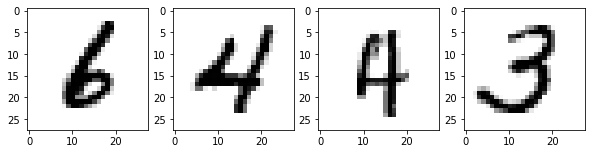

In [7]:
fig = plt.figure(figsize=(10, 10))
def show_image(i, image): 
  # image = image.reshape(1, 28, 28)
  fig.add_subplot(1, 4, i+1)
  plt.imshow(image.numpy().squeeze(), cmap='gray_r')
  

for i in range(0, 4):
  show_image(i, images[i])
plt.show()

# Vector-Quantized Variational Autoencoder
Quelle: https://github.com/ritheshkumar95/pytorch-vqvae/blob/master/modules.py

In [0]:
def weights_init(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    try:
      nn.init.xavier_uniform_(m.weight.data)
      m.bias.data.fill_(0)
    except AttributeError:
      print("Skipping initialization of ", classname)

class VAE(nn.Module):
  def __init__(self, input_dim, dim, z_dim):
    super().__init__()
    self.encoder = nn.Sequential(
      nn.Conv2d(input_dim, dim, 4, 2, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.Conv2d(dim, dim, 4, 2, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.Conv2d(dim, dim, 5, 1, 0),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.Conv2d(dim, z_dim * 2, 3, 1, 0),
      nn.BatchNorm2d(z_dim * 2)
    )

    self.decoder = nn.Sequential(
      nn.ConvTranspose2d(z_dim, dim, 3, 1, 0),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.ConvTranspose2d(dim, dim, 5, 1, 0),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.ConvTranspose2d(dim, dim, 4, 2, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.ConvTranspose2d(dim, input_dim, 4, 2, 1),
      nn.Tanh()
    )

    self.apply(weights_init)

  def forward(self, x):
    mu, logvar = self.encoder(x).chunk(2, dim=1)

    q_z_x = Normal(mu, logvar.mul(.5).exp())
    p_z = Normal(torch.zeros_like(mu), torch.ones_like(logvar))
    kl_div = kl_divergence(q_z_x, p_z).sum(1).mean()

    x_tilde = self.decoder(q_z_x.rsample())
    return x_tilde, kl_div

In [0]:
# https://github.com/ritheshkumar95/pytorch-vqvae/blob/master/functions.py
from torch.autograd import Function
class VectorQuantization(Function):
  @staticmethod
  def forward(ctx, inputs, codebook):
    with torch.no_grad():
      embedding_size = codebook.size(1)
      inputs_size = inputs.size()
      inputs_flatten = inputs.view(-1, embedding_size)

      codebook_sqr = torch.sum(codebook ** 2, dim=1)
      inputs_sqr = torch.sum(inputs_flatten ** 2, dim=1, keepdim=True)

      # Compute the distances to the codebook
      distances = torch.addmm(codebook_sqr + inputs_sqr,
          inputs_flatten, codebook.t(), alpha=-2.0, beta=1.0)

      _, indices_flatten = torch.min(distances, dim=1)
      indices = indices_flatten.view(*inputs_size[:-1])
      ctx.mark_non_differentiable(indices)

      return indices

  @staticmethod
  def backward(ctx, grad_output):
    raise RuntimeError('Trying to call `.grad()` on graph containing '
        '`VectorQuantization`. The function `VectorQuantization` '
        'is not differentiable. Use `VectorQuantizationStraightThrough` '
        'if you want a straight-through estimator of the gradient.')

class VectorQuantizationStraightThrough(Function):
  @staticmethod
  def forward(ctx, inputs, codebook):
    indices = vq(inputs, codebook)
    indices_flatten = indices.view(-1)
    ctx.save_for_backward(indices_flatten, codebook)
    ctx.mark_non_differentiable(indices_flatten)

    codes_flatten = torch.index_select(codebook, dim=0,
        index=indices_flatten)
    codes = codes_flatten.view_as(inputs)

    return (codes, indices_flatten)

  @staticmethod
  def backward(ctx, grad_output, grad_indices):
    grad_inputs, grad_codebook = None, None

    if ctx.needs_input_grad[0]:
      # Straight-through estimator
      grad_inputs = grad_output.clone()
    if ctx.needs_input_grad[1]:
      # Gradient wrt. the codebook
      indices, codebook = ctx.saved_tensors
      embedding_size = codebook.size(1)

      grad_output_flatten = (grad_output.contiguous()
                                        .view(-1, embedding_size))
      grad_codebook = torch.zeros_like(codebook)
      grad_codebook.index_add_(0, indices, grad_output_flatten)

    return (grad_inputs, grad_codebook)

In [0]:
class VQEmbedding(nn.Module):
  def __init__(self, K, D):
    super().__init__()
    self.embedding = nn.Embedding(K, D)
    self.embedding.weight.data.uniform_(-1./K, 1./K)

  def forward(self, z_e_x):
    z_e_x_ = z_e_x.permute(0, 2, 3, 1).contiguous()
    latents = vq(z_e_x_, self.embedding.weight)
    return latents

  def straight_through(self, z_e_x):
    z_e_x_ = z_e_x.permute(0, 2, 3, 1).contiguous()
    z_q_x_, indices = vq_st(z_e_x_, self.embedding.weight.detach())
    z_q_x = z_q_x_.permute(0, 3, 1, 2).contiguous()

    z_q_x_bar_flatten = torch.index_select(self.embedding.weight,
        dim=0, index=indices)
    z_q_x_bar_ = z_q_x_bar_flatten.view_as(z_e_x_)
    z_q_x_bar = z_q_x_bar_.permute(0, 3, 1, 2).contiguous()

    return z_q_x, z_q_x_bar

In [0]:
class ResBlock(nn.Module):
  def __init__(self, dim):
    super().__init__()
    self.block = nn.Sequential(
      nn.ReLU(True),
      nn.Conv2d(dim, dim, 3, 1, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.Conv2d(dim, dim, 1),
      nn.BatchNorm2d(dim)
    )

  def forward(self, x):
    return x + self.block(x)

In [0]:
class VectorQuantizedVAE(nn.Module):
  def __init__(self, input_dim, dim, K=512):
    super().__init__()
    self.encoder = nn.Sequential(
      nn.Conv2d(input_dim, dim, 4, 2, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.Conv2d(dim, dim, 4, 2, 1),
      ResBlock(dim),
      ResBlock(dim),
    )

    self.codebook = VQEmbedding(K, dim)

    self.decoder = nn.Sequential(
      ResBlock(dim),
      ResBlock(dim),
      nn.ReLU(True),
      nn.ConvTranspose2d(dim, dim, 4, 2, 1),
      nn.BatchNorm2d(dim),
      nn.ReLU(True),
      nn.ConvTranspose2d(dim, input_dim, 4, 2, 1),
      nn.Tanh()
    )

    self.apply(weights_init)

  def encode(self, x):
    z_e_x = self.encoder(x)
    latents = self.codebook(z_e_x)
    return latents

  def decode(self, latents):
    z_q_x = self.codebook.embedding(latents).permute(0, 3, 1, 2)  # (B, D, H, W)
    x_tilde = self.decoder(z_q_x)
    return x_tilde

  def forward(self, x):
    z_e_x = self.encoder(x)
    z_q_x_st, z_q_x = self.codebook.straight_through(z_e_x)
    x_tilde = self.decoder(z_q_x_st)
    return x_tilde, z_e_x, z_q_x


# PixelCNN from older exercise

In [0]:
# Quelle: https://www.codeproject.com/Articles/5061271/PixelCNN-in-Autoregressive-Models
class MaskedConv2d(torch.nn.Conv2d):
  def __init__(self, mask_type, *args, **kwargs):
    super().__init__(*args, **kwargs)
    assert mask_type in ('A', 'B')
    self.register_buffer('mask', self.weight.data.clone())
    _, _, fH, fW = self.weight.size()
    
    self.mask.fill_(1)
    if (mask_type == 'B'): 
      self.mask[:, :, fH // 2, fW // 2 + 1:] = 0
    else:
      self.mask[:, :, fH // 2, fW // 2:] = 0
    
    self.mask[:, :, fH // 2 + 1:] = 0

  def forward(self, x):
    self.weight.data *= self.mask
    return super(MaskedConv2d, self).forward(x)

In [0]:
class PixelCNNResBlock(torch.nn.Module):
  def __init__(self, channels=64):
    super(ResBlock, self).__init__()
    self.channels=channels

    self.network = torch.nn.Sequential(
      torch.nn.ReLU(),
      torch.nn.Conv2d(self.channels*2,self.channels, 1, stride=1, padding=0), 
      torch.nn.BatchNorm2d(self.channels), 
      torch.nn.ReLU(),
      MaskedConv2d('B',self.channels, self.channels, 3, stride=1, padding=1),
      torch.nn.BatchNorm2d(self.channels), 
      torch.nn.ReLU(),
      torch.nn.Conv2d(self.channels,self.channels*2, 1, stride=1, padding=0),
      torch.nn.BatchNorm2d(2*self.channels)
    )
    
  def forward(self, x):
    out = self.network(x)
    return x + out

In [0]:
class PixelCNN(torch.nn.Module):
    
  def __init__(self, channels=16, out_dim=12, res_blocks=12): 
    super(PixelCNN,self).__init__()
    layers = []
    layers.append(MaskedConv2d("A", 3, channels*2, 7, padding=3))

    for i in range(res_blocks):
      layers.append(PixelCNNResBlock(channels))

    layers.append(torch.nn.ReLU())
    layers.append(torch.nn.Conv2d(channels*2, 1024, 1, 1, 0))
    layers.append(torch.nn.ReLU())
    layers.append(torch.nn.Conv2d(1024, out_dim, 1, 1, 0))

    self.network = torch.nn.Sequential(*layers)
   
  def forward(self, x):
    batch_size = x.shape[0]
    pixel_cnn = self.network(x).view(batch_size, 4, 3, 28, 28)
    return pixel_cnn

## Train the Vector-Quantized Variational Autoencoder

In [0]:
vq = VectorQuantization.apply
vq_st = VectorQuantizationStraightThrough.apply

model = VectorQuantizedVAE(1, 128).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [0]:
def generate_samples(images, model):
  with torch.no_grad():
    images = images.to(device)
    x_tilde, _, _ = model(images)
  return x_tilde

In [0]:
tb_writer = SummaryWriter()
fixed_images, _ = next(iter(test_loader))
fixed_grid = make_grid(fixed_images, nrow=10, range=(-1, 1), normalize=True)
tb_writer.add_image('original', fixed_grid, 0)

In [19]:
%tensorboard --logdir {logs_base_dir}

Reusing TensorBoard on port 6006 (pid 1120), started 0:42:09 ago. (Use '!kill 1120' to kill it.)

In [0]:
j = 0
count = 0
for epoch in range(EPOCHS):
  for i, x in enumerate(train_loader, 0):
    x = x[0].to(device).float()
    optimizer.zero_grad()
    x_tilde, z_e_x, z_q_x = model(x)

    # Reconstruction loss
    loss_recons = F.mse_loss(x_tilde, x)
    # Vector quantization objective
    loss_vq = F.mse_loss(z_q_x, z_e_x.detach())
    # Commitment objective
    loss_commit = F.mse_loss(z_e_x, z_q_x.detach())

    loss = loss_recons + loss_vq + beta * loss_commit
    loss.backward()

    # Logs
    tb_writer.add_scalar('loss/train/reconstruction', loss_recons.item(), count)
    tb_writer.add_scalar('loss/train/quantization', loss_vq.item(), count)

    optimizer.step()

    if ((i+1) % 100 == 0):
      with torch.set_grad_enabled(False):
        x_val = next(iter(test_loader))
        x_val = x_val[0].to(device)
        x_tilde, z_e_x, z_q_x = model(x_val)

        # Reconstruction loss
        loss_recons = F.mse_loss(x_tilde, x_val)
        # Vector quantization objective
        loss_vq = F.mse_loss(z_q_x, z_e_x.detach())
        # Commitment objective
        loss_commit = F.mse_loss(z_e_x, z_q_x.detach())

        loss = loss_recons + loss_vq + beta * loss_commit


        # Logs
        tb_writer.add_scalar('loss/test/reconstruction', loss_recons.item(), j)
        tb_writer.add_scalar('loss/test/quantization', loss_vq.item(), j)

        reconstruction = generate_samples(fixed_images, model)
        grid = make_grid(reconstruction.cpu(), nrow=10, range=(-1, 1), normalize=True)
        tb_writer.add_image('reconstruction', grid, j)
        j += 1
    count += 1

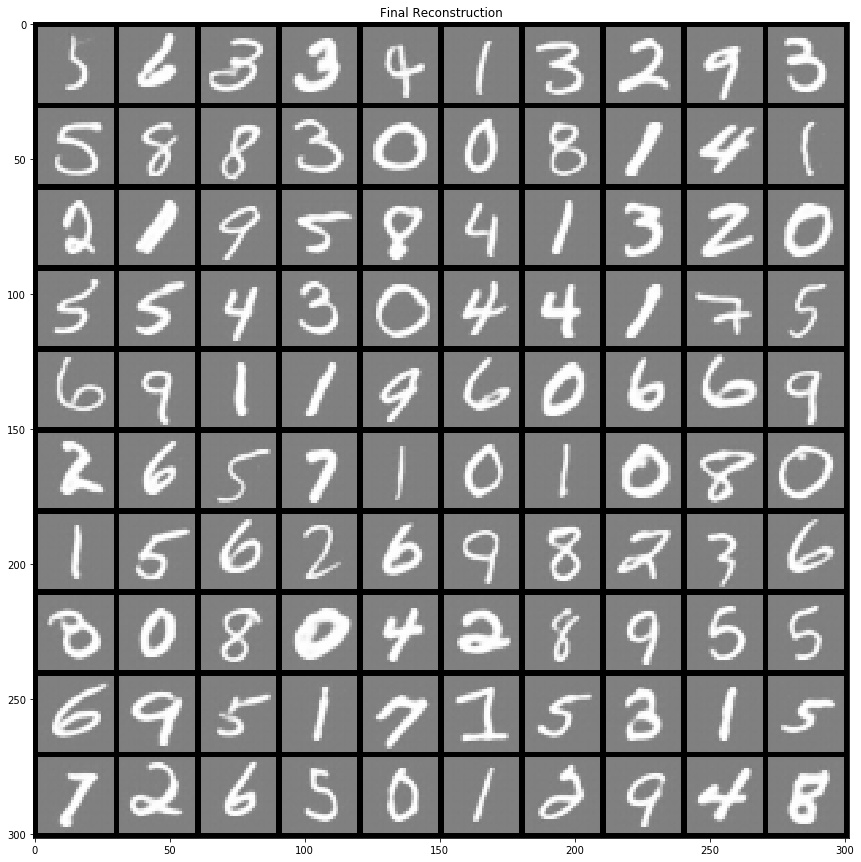

In [27]:
reconstruction = generate_samples(fixed_images, model)
grid = make_grid(reconstruction.cpu(), nrow=10, range=(-1, 1), normalize=True)
fig = plt.figure(figsize=(15,15))
plt.imshow(np.transpose(grid, (1,2,0)), cmap="gray")
plt.title("Final Reconstruction")
plt.show()